Office Jigsaw Puzzle

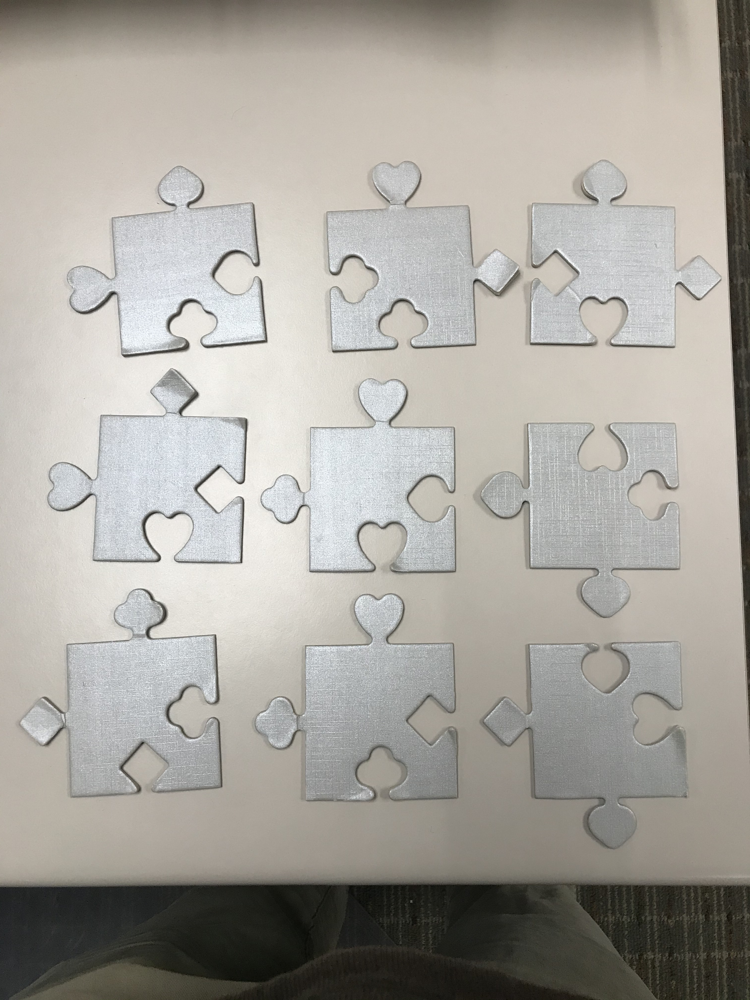

3 X 3 puzzle with no design and one correct solution.

These letters will correlate to the puzzle peices in the picture, where a is the peice in the top left corner of the picture.

a b c

d e f

g h i

In [1]:
import numpy as np
from itertools import permutations
from itertools import combinations

#assign the suit tabs and sockets numbers

tabs = {"Diamond":1, "Heart":2, "Spade":3, "Club":4}
sockets = {"Diamond":-1, "Heart":-2, "Spade":-3, "Club":-4}

In [2]:
#Make class for the puzzle pieces

class PuzzlePiece:
    
    def __init__(self, name, left, right, up, down):
        self.name = name
        self.left = left
        self.right = right
        self.up = up
        self.down = down
        
        
        self.array = np.array([[self.left, self.up], [self.down, self.right]])
        self.array_list = [self.array, np.rot90(self.array, -1), np.rot90(self.array, -2), np.rot90(self.array, -3)]
        #keeps count of rotations clockwise
        self.rotations = 0
        
    def __repr__(self):
        return self.name
    
    def __str__(self):
        return '\n'.join([' '.join([f'{item:4}' for item in row]) for row in self.array])
    
    #to turn the piece once clockwise
    def turn(self):
        self.array = np.rot90(self.array, -1)
        self.rotations += 1
        
        if self.rotations == 4:
            self.rotations = 0
        

In [3]:
#Create the 9 peices, as shown in the picture (reset)
def create_pieces():
    a = PuzzlePiece("a", tabs["Heart"], sockets["Spade"], tabs["Spade"], sockets["Club"])
    b = PuzzlePiece("b", sockets["Club"], tabs["Diamond"], tabs["Heart"], sockets["Club"])
    c = PuzzlePiece("c", sockets["Diamond"], tabs["Diamond"], tabs["Spade"], sockets["Heart"])
    d = PuzzlePiece("d", tabs["Heart"], sockets["Diamond"], tabs["Diamond"], sockets["Heart"])
    e = PuzzlePiece("e", tabs["Club"], sockets["Spade"], tabs["Heart"], sockets["Heart"])
    f = PuzzlePiece("f", tabs["Spade"], sockets["Club"], sockets["Heart"], tabs["Spade"])
    g = PuzzlePiece("g", tabs["Diamond"], sockets["Club"], tabs["Club"], sockets["Diamond"])
    h = PuzzlePiece("h", tabs["Club"], sockets["Diamond"], tabs["Heart"], sockets["Club"])
    i = PuzzlePiece("i", tabs["Diamond"], sockets["Heart"], sockets["Spade"], tabs["Spade"])

    return a, b, c, d, e, f, g, h, i

a, b, c, d, e, f, g, h, i = create_pieces()

In [4]:
def row_1(puzzle):
    
    return ((puzzle[0].array[1][1] + puzzle[1].array[0][0] == 0) and
    (puzzle[1].array[1][1] + puzzle[2].array[0][0] == 0)) 

In [5]:
def row_2(puzzle):
    
    return ((puzzle[3].array[1][1] + puzzle[4].array[0][0] == 0) and
    (puzzle[4].array[1][1] + puzzle[5].array[0][0] == 0)) 

In [6]:
def row_3(puzzle):
    
    return ((puzzle[6].array[1][1] + puzzle[7].array[0][0] == 0) and
    (puzzle[7].array[1][1] + puzzle[8].array[0][0] == 0))

In [7]:
def col_1(puzzle):
    
    return ((puzzle[0].array[1][0] + puzzle[3].array[0][1] == 0) and
    (puzzle[3].array[1][0] + puzzle[6].array[0][1] == 0))

In [8]:
def col_2(puzzle):
    
    return ((puzzle[1].array[1][0] + puzzle[4].array[0][1] == 0) and
    (puzzle[4].array[1][0] + puzzle[7].array[0][1] == 0))

In [9]:
def col_3(puzzle):
    
    return ((puzzle[2].array[1][0] + puzzle[5].array[0][1] == 0) and
    (puzzle[5].array[1][0] + puzzle[8].array[0][1] == 0))

In [10]:
#Checks for solution combination
def valid_full(puzzle):
    
    return ((puzzle[0].array[1][1] + puzzle[1].array[0][0] == 0) and
    (puzzle[1].array[1][1] + puzzle[2].array[0][0] == 0) and
    (puzzle[0].array[1][0] + puzzle[3].array[0][1] == 0) and
    (puzzle[1].array[1][0] + puzzle[4].array[0][1] == 0) and
    (puzzle[3].array[1][1] + puzzle[4].array[0][0] == 0) and
    (puzzle[2].array[1][0] + puzzle[5].array[0][1] == 0) and
    (puzzle[4].array[1][1] + puzzle[5].array[0][0] == 0) and
    (puzzle[3].array[1][0] + puzzle[6].array[0][1] == 0) and
    (puzzle[4].array[1][0] + puzzle[7].array[0][1] == 0) and
    (puzzle[6].array[1][1] + puzzle[7].array[0][0] == 0) and
    (puzzle[5].array[1][0] + puzzle[8].array[0][1] == 0) and
    (puzzle[7].array[1][1] + puzzle[8].array[0][0] == 0))
        

In [11]:
# Generate all permutations of piece positions
puzzle = list(permutations([a,b,c,d,e,f,g,h,i]))

In [12]:
len(puzzle)

362880

In [13]:
#Permutations that will work for Row 1

puzzle1 = []

for puzzle in puzzle:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if row_1(puzzle):
                    puzzle1.append(puzzle)
                puzzle[2].turn()
            puzzle[1].turn()
        puzzle[0].turn()

In [14]:
print(len(puzzle1))

338400


In [15]:
puzzle1 = set(puzzle1)

len(puzzle1)

239040

In [16]:
#Permutations that will work for Row 2

puzzle2 = []

for puzzle in puzzle1:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if row_2(puzzle):
                    puzzle2.append(puzzle)
                puzzle[5].turn()
            puzzle[4].turn()
        puzzle[3].turn()

In [17]:
len(puzzle2)

224376

In [18]:
puzzle2 = set(puzzle2)

len(puzzle2)

156480

In [19]:
#Permutations that will work for Row 3

puzzle3 = []

for puzzle in puzzle2:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if row_3(puzzle):
                    puzzle3.append(puzzle)
                puzzle[8].turn()
            puzzle[7].turn()
        puzzle[6].turn()

In [20]:
len(puzzle3)

149088

In [21]:
puzzle3 = set(puzzle3)

len(puzzle3)

102480

In [22]:
#Permutations that will work for Column 1

puzzle4 = []

for puzzle in puzzle3:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if col_1(puzzle):
                    puzzle4.append(puzzle)
                puzzle[6].turn()
            puzzle[3].turn()
        puzzle[0].turn()

In [23]:
len(puzzle4)

92970

In [24]:
puzzle4 = set(puzzle4)

len(puzzle4)

65826

In [25]:
#Permutations that will work for Column 2

puzzle5 = []

for puzzle in puzzle4:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if col_2(puzzle):
                    puzzle5.append(puzzle)
                puzzle[7].turn()
            puzzle[4].turn()
        puzzle[1].turn()

In [26]:
len(puzzle5)

52940

In [27]:
puzzle5 = set(puzzle5)

len(puzzle5)

40214

In [28]:
#Permutations that will work for Column 3

puzzle6 = []

for puzzle in puzzle5:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if col_3(puzzle):
                    puzzle6.append(puzzle)
                puzzle[8].turn()
            puzzle[5].turn()
        puzzle[2].turn()

In [29]:
len(puzzle6)

36956

In [30]:
puzzle6 = set(puzzle6)

len(puzzle6)

25384

In [ ]:
a, b, c, d, e, f, g, h, i = create_pieces()

puzzle_final = []
rotations_final = []

for puzzle in puzzle6:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                for m in range(0,4):
                    for n in range(0,4):
                        for o in range(0,4):
                            for p in range(0,4):
                                for q in range(0,4):
                                    for r in range(0,4):
                                        if valid_full(puzzle):
                                            print('It worked!')
                                            puzzle_final.append(puzzle)
                                            rotations_final = [puzzle[0].rotations, puzzle[1].rotations, puzzle[2].rotations, 
                                                               puzzle[3].rotations, puzzle[4].rotations, puzzle[5].rotations, 
                                                               puzzle[6].rotations, puzzle[7].rotations, puzzle[8].rotations]
                                            print(puzzle)
                                            print(f'Position 0: {puzzle[0].rotations % 4}')
                                            print(f'Position 1: {puzzle[1].rotations % 4}')
                                            print(f'Position 2: {puzzle[2].rotations % 4}')
                                            print(f'Position 3: {puzzle[3].rotations % 4}')
                                            print(f'Position 4: {puzzle[4].rotations % 4}')
                                            print(f'Position 5: {puzzle[5].rotations % 4}')
                                            print(f'Position 6: {puzzle[6].rotations % 4}')
                                            print(f'Position 7: {puzzle[7].rotations % 4}')
                                            print(f'Position 8: {puzzle[8].rotations % 4}')
                                            break
                                        puzzle[8].turn()
                                    puzzle[7].turn()
                                puzzle[6].turn()
                            puzzle[5].turn()
                        puzzle[4].turn()
                    puzzle[3].turn()
                puzzle[2].turn()
            puzzle[1].turn()
        puzzle[0].turn()

It worked!
(i, a, c, d, e, h, f, g, b)
Position 0: 3
Position 1: 2
Position 2: 1
Position 3: 3
Position 4: 3
Position 5: 3
Position 6: 0
Position 7: 3
Position 8: 2
It worked!
(b, g, f, h, e, d, c, a, i)
Position 0: 0
Position 1: 1
Position 2: 2
Position 3: 1
Position 4: 1
Position 5: 1
Position 6: 3
Position 7: 0
Position 8: 1


Took awhile but it worked!

final solution shown below:

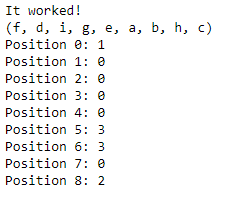

so the final arrangement of pieces is:

f  d  i

g  e  a

b  h  c

and rotations 90 degrees clockwise in association with starting position in the picture:

f = 1

d = 0

i = 0

g = 0

e = 0

a = 3

b = 3

h = 0

c = 2


def cross(puzzle):
    
    return ((puzzle[1].array[1][0] + puzzle[4].array[0][1] == 0) and
    (puzzle[4].array[1][0] + puzzle[7].array[0][1] == 0) and
    (puzzle[3].array[1][1] + puzzle[4].array[0][0] == 0) and
    (puzzle[4].array[1][1] + puzzle[5].array[0][0] == 0))

def row_1_2(puzzle):
    
    return ((puzzle[0].array[1][1] + puzzle[1].array[0][0] == 0) and
    (puzzle[1].array[1][1] + puzzle[2].array[0][0] == 0) and 
    (puzzle[3].array[1][1] + puzzle[4].array[0][0] == 0) and
    (puzzle[4].array[1][1] + puzzle[5].array[0][0] == 0) and 
    (puzzle[0].array[1][0] + puzzle[3].array[0][1] == 0) and
    (puzzle[1].array[1][0] + puzzle[4].array[0][1] == 0) and
    (puzzle[2].array[1][0] + puzzle[5].array[0][1] == 0))

#Permutations that will work for Column 3

puzzle7 = []

for puzzle in puzzle6:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                for m in range(0,4):
                    for n in range(0,4):
                        if cross(puzzle):
                            puzzle7.append(puzzle)
                        puzzle[7].turn()
                    puzzle[5].turn()
                puzzle[4].turn()
            puzzle[3].turn()
        puzzle[1].turn()

len(puzzle7)

puzzle7 = set(puzzle7)

len(puzzle7)

a, b, c, d, e, f, g, h, i = create_pieces()

puzzle8 = []
rotations8 = []

for puzzle in puzzle7:
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if row_1(puzzle):
                    puzzle8.append(puzzle)
                    rotations8.append([puzzle[0].rotations, puzzle[1].rotations, puzzle[2].rotations])
                puzzle[2].turn()
            puzzle[1].turn()
        puzzle[0].turn()

print(len(puzzle8))
print(len(rotations8))
print(puzzle8[50])
print(rotations8[50])

print((a) in puzzle8)

def rotations_reset(puzzle):
    while puzzle[0].rotations != 0:
        puzzle[0].turn()
    while puzzle[1].rotations != 0:
        puzzle[1].turn()
    while puzzle[2].rotations != 0:
        puzzle[2].turn()
    while puzzle[3].rotations != 0:
        puzzle[3].turn()
    while puzzle[4].rotations != 0:
        puzzle[4].turn()
    while puzzle[5].rotations != 0:
        puzzle[5].turn()
    while puzzle[6].rotations != 0:
        puzzle[6].turn()
    while puzzle[7].rotations != 0:
        puzzle[7].turn()
    while puzzle[8].rotations != 0:
        puzzle[8].turn()

puzzle9 = []
rotations9 = []

for p in range(0,len(puzzle8)):
    
    for m in range(0, rotations8[p][0]):
        puzzle8[p][0].turn()
    for n in range(0, rotations8[p][1]):
        puzzle8[p][1].turn()
    for o in range(0, rotations8[p][2]):
        puzzle8[p][2].turn()
        
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if row_1_2(puzzle8[p]):
                    puzzle9.append(puzzle8[p])
                    rotations9.append([puzzle8[p][0].rotations, puzzle8[p][1].rotations, puzzle8[p][2].rotations, puzzle8[p][3].rotations, puzzle8[p][4].rotations, puzzle8[p][5].rotations])
                puzzle[5].turn()
            puzzle[4].turn()
        puzzle[3].turn()
        
    rotations_reset(puzzle8[p])

print(len(puzzle9))
print(len(rotations9))

puzzle9

puzzle10 = []
rotations10 = []

for p in range(0,5):
    
    for m in range(0, rotations9[p][0]):
        puzzle9[p][0].turn()
    for n in range(0, rotations9[p][1]):
        puzzle9[p][1].turn()
    for o in range(0, rotations9[p][2]):
        puzzle9[p][2].turn()
    for q in range(0, rotations9[p][3]):
        puzzle9[p][3].turn()
    for r in range(0, rotations9[p][4]):
        puzzle9[p][4].turn()
    for s in range(0, rotations9[p][5]):
        puzzle9[p][5].turn()
               
    for j in range(0,4):
        for k in range(0,4):
            for l in range(0,4):
                if valid_full(puzzle9[p]):
                    puzzle10.append(puzzle9[p])
                    rotations10.append([puzzle9[p][0].rotations, puzzle9[p][1].rotations, puzzle9[p][2].rotations, puzzle9[p][3].rotations, puzzle9[p][4].rotations, puzzle9[p][5].rotations, puzzle9[p][6].rotations, puzzle9[p][7].rotations, puzzle9[p][8].rotations])
                puzzle[8].turn()
            puzzle[7].turn()
        puzzle[6].turn()
        
    rotations_reset(puzzle9[p])
    

print(len(puzzle10))
print(len(rotations10))

print(puzzle10)